Credit to the original authors before I modified it: https://github.com/ndahlquist/pytorch-fourier-feature-networks

<a href="https://colab.research.google.com/github/ndahlquist/pytorch-fourier-feature-networks/blob/notebook/demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In this notebook, let's try fitting a function to produce the image as a function of (X,Y) image coordinates. We'll start with the naive approach, and then introduce the Gaussian Fourier Feature mapping.

This is a Pytorch adaptation of the original notebook here: https://github.com/tancik/fourier-feature-networks/blob/master/Demo.ipynb.

In [1]:
import imageio
import numpy as np
import torch
import torch.nn as nn
from rp import *
from tqdm.notebook import tqdm as tqdm

### Learnable Images

In [2]:
class GaussianFourierFeatureTransform:
    """
    Original authors: https://github.com/ndahlquist/pytorch-fourier-feature-networks
    
    An implementation of Gaussian Fourier feature mapping.

    "Fourier Features Let Networks Learn High Frequency Functions in Low Dimensional Domains":
       https://arxiv.org/abs/2006.10739
       https://people.eecs.berkeley.edu/~bmild/fourfeat/index.html

    Given an input of size [batches, num_input_channels, width, height],
     returns a tensor of size [batches, mapping_size*2, width, height].
    """

    def __init__(self, num_input_channels, mapping_size=256, scale=10):
        super().__init__()

        self._num_input_channels = num_input_channels
        self._mapping_size = mapping_size
        self._B = torch.randn((num_input_channels, mapping_size)) * scale

    def __call__(self, x):
        assert x.dim() == 4, 'Expected 4D input (got {}D input)'.format(x.dim())

        batches, channels, width, height = x.shape

        assert channels == self._num_input_channels,\
            "Expected input to have {} channels (got {} channels)".format(self._num_input_channels, channels)

        # Make shape compatible for matmul with _B.
        # From [B, C, W, H] to [(B*W*H), C].
        x = x.permute(0, 2, 3, 1).reshape(batches * width * height, channels)

        x = x @ self._B.to(x.device)

        # From [(B*W*H), C] to [B, W, H, C]
        x = x.view(batches, width, height, self._mapping_size)
        # From [B, W, H, C] to [B, C, W, H]
        x = x.permute(0, 3, 1, 2)

        x = 2 * np.pi * x
        return torch.cat([torch.sin(x), torch.cos(x)], dim=1)

In [3]:
def get_xy_grid(height:int,width:int,batch_size:int=1)->torch.Tensor:
    #Returns a torch cpu tensor of shape (batch_size,2,height,width)
    #The second dimension is (x,y) coordinates, which go from [0 to 1) from edge to edge
    #(In other words, it will include x=y=0, but instead of x=y=1 the other corner will be x=y=.999)
    assert height>0 and width>0 and batch_size>0,'All dimensions must be positive integers'
    
    y_coords = np.linspace(0, 1, height, endpoint=False)
    x_coords = np.linspace(0, 1, width , endpoint=False)
    xy_grid = np.stack(np.meshgrid(y_coords, x_coords), -1)
    xy_grid = torch.tensor(xy_grid).unsqueeze(0).permute(0, 3, 1, 2).float().contiguous()
    xy_grid = xy_grid.repeat(batch_size,1,1,1)
    
    assert tuple(xy_grid.shape)==(batch_size,2,height,width)
    
    return xy_grid

In [4]:
class LearnableImageViaFourierFeatures(nn.Module):
    def __init__(self,
                 height=256,       # Height of the learnable images
                 width=256,        # Width of the learnable images
                 num_channels=3,   # Number of channels in the images
                 hidden_dim=256,   # Number of dimensions per hidden layer of the MLP
                 mapping_size=128, # Number of fourier features per coordinate
                 scale=10,         # Magnitude of the initial feature noise
                 device='cpu',     # Please set this correctly if you want GPU
                ):
        super().__init__()
        
        self.height      =height
        self.width       =width
        self.num_channels=num_channels
        self.mapping_size=mapping_size
        self.scale       =scale
        self.device      =device
        
        # The following objects do NOT have parameters, and are not changed while optimizing this class
        self.xy_grid =get_xy_grid(height,width,batch_size=1).to(device)
        self.feature_extractor=GaussianFourierFeatureTransform(2, mapping_size, scale)
        self.features=self.feature_extractor(self.xy_grid).to(device) # pre-compute this if we're regressing on images
        
        H=hidden_dim # Number of hidden features. These 1x1 convolutions act as a per-pixel MLP
        C=num_channels  # Shorter variable names let us align the code better
        M=2*mapping_size
        self.model = nn.Sequential(
                nn.Conv2d(M, H, kernel_size=1), nn.ReLU(), nn.BatchNorm2d(H),
                nn.Conv2d(H, H, kernel_size=1), nn.ReLU(), nn.BatchNorm2d(H),
                nn.Conv2d(H, H, kernel_size=1), nn.ReLU(), nn.BatchNorm2d(H),
                nn.Conv2d(H, C, kernel_size=1),
                nn.Sigmoid(),
            ).to(device)
    
    def project(self,uv_maps):
        assert len(uv_maps.shape)==(4)
        assert uv_maps.shape[1]==2 # Should have two channels: u,v
        return self.model(self.feature_extractor(uv_maps))
    
    def forward(self):
        # Return all the image we've learned
        return self.model(self.features)

In [5]:
class LearnableImageViaSimpleMLP(nn.Module):
    def __init__(self,
                 height,           # Height of the learnable images
                 width,            # Width of the learnable images
                 num_channels=3,   # Number of channels in the images
                 hidden_dim=256,   # Number of dimensions per hidden layer of the MLP
                 device='cpu',     # Please set this correctly if you want GPU
                ):
        super().__init__()
        
        self.height      =height
        self.width       =width
        self.num_channels=num_channels
        self.device      =device
        
        # The following Tensor is NOT a parameter, and is not changed while optimizing this class
        self.xy_grid =get_xy_grid(height,width,batch_size=1).to(device)
        
        H=hidden_dim # Number of hidden features. These 1x1 convolutions act as a per-pixel MLP
        C=num_channels  # Shorter variable names let us align the code better
        self.model = nn.Sequential(
                nn.Conv2d(2, H, kernel_size=1), nn.ReLU(), nn.BatchNorm2d(H),
                nn.Conv2d(H, H, kernel_size=1), nn.ReLU(), nn.BatchNorm2d(H),
                nn.Conv2d(H, H, kernel_size=1), nn.ReLU(), nn.BatchNorm2d(H),
                nn.Conv2d(H, C, kernel_size=1),
                nn.Sigmoid(),
            ).to(device)
            
    def forward(self):
        return self.model(self.xy_grid)

### Running Tests

In [6]:
def run_test(learner='fourier',
             mapping_size=128,
             hidden_dim=256,
             scale=10,
             iter_per_epoch=100,
             num_epochs=4):
    assert learner in 'fourier simple'.split()
    
    def tensor_to_numpy(tensor: torch.Tensor) -> np.ndarray:
        tensor = tensor * 256
        tensor[tensor > 255] = 255
        tensor[tensor < 0] = 0
        tensor = tensor.type(torch.uint8).permute(1, 2, 0).cpu().numpy()

        return tensor

    def get_image():
        image_url = 'https://live.staticflickr.com/7492/15677707699_d9d67acf9d_b.jpg'
        img = imageio.imread(image_url)[..., :3] / 255.
        c = [img.shape[0] // 2, img.shape[1] // 2]
        r = 256
        img = img[c[0] - r:c[0] + r, c[1] - r:c[1] + r]

        return img
    # Note: this can be done outside of the training loop, since the result at this stage is unchanged during the course of training.
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(device)

    # Get an image that will be the target for our model.
    target = torch.tensor(get_image()).unsqueeze(0).permute(0, 3, 1, 2).to(device)
    print('Target:')
    display_image(tensor_to_numpy(target[0]))
    
    if learner=='simple':
        x=LearnableImageViaSimpleMLP(512,512,hidden_dim=hidden_dim,device=device)
    else:
        x=LearnableImageViaFourierFeatures(512,
                                            512,
                                            mapping_size=mapping_size,
                                            hidden_dim=hidden_dim,
                                            scale=scale,
                                            device=device)
    
    optimizer = torch.optim.Adam(list(x.parameters()), lr=1e-4)

    for epoch in tqdm(range(num_epochs*iter_per_epoch)):
        optimizer.zero_grad()

        generated = x()

        loss = torch.nn.functional.l1_loss(target, generated)

        loss.backward()
        optimizer.step()

        if epoch % iter_per_epoch == 0:
            print('Epoch %d, loss = %.03f' % (epoch, float(loss)))
            display_image(tensor_to_numpy(generated[0]))

cuda
Target:


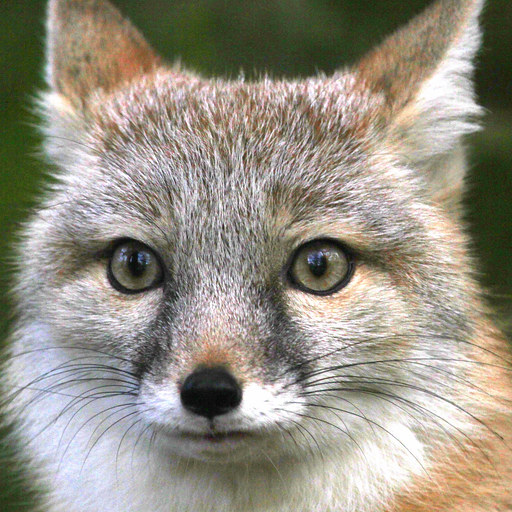

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch 0, loss = 0.226


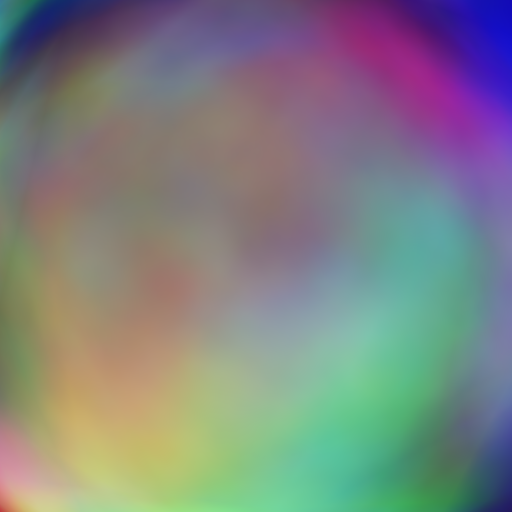

Epoch 100, loss = 0.093


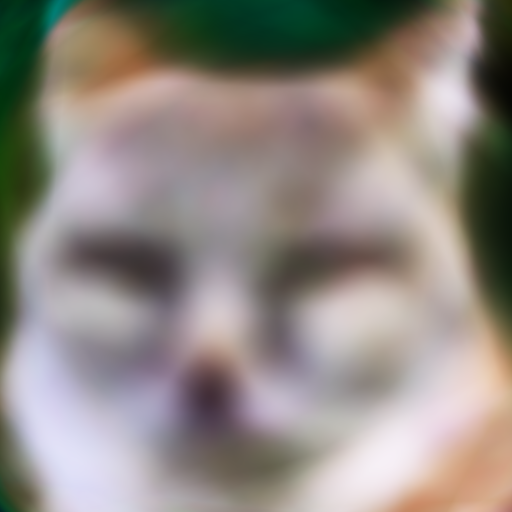

Epoch 200, loss = 0.083


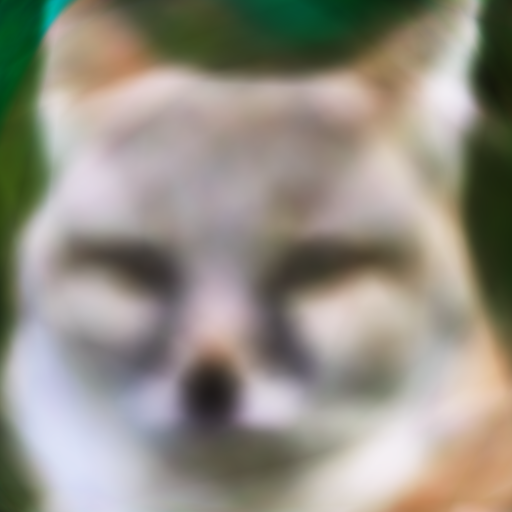

Epoch 300, loss = 0.073


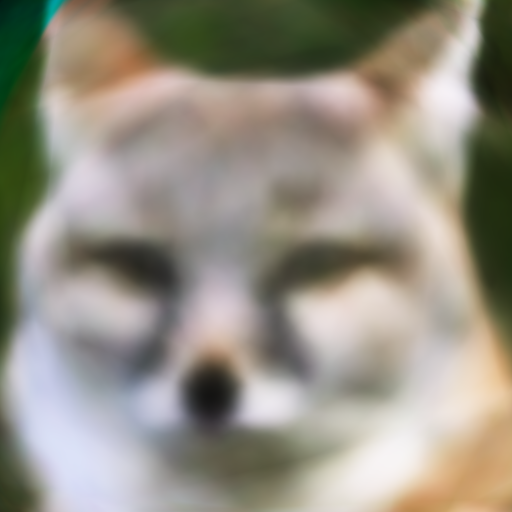

In [7]:
run_test('simple',hidden_dim=1024,iter_per_epoch=100,num_epochs=4)

cuda
Target:


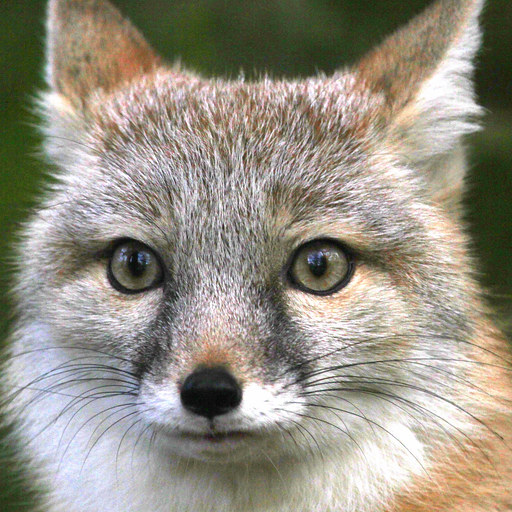

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch 0, loss = 0.246


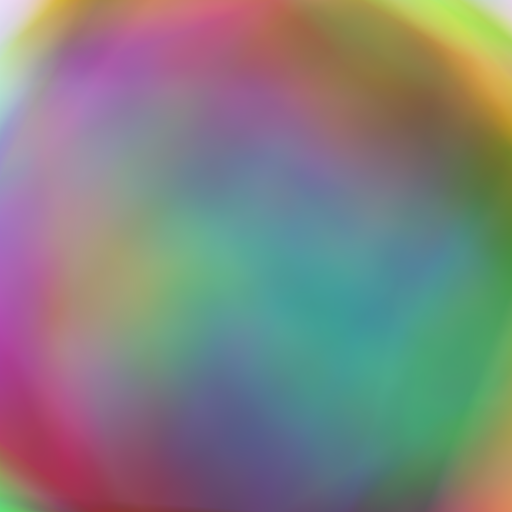

Epoch 100, loss = 0.107


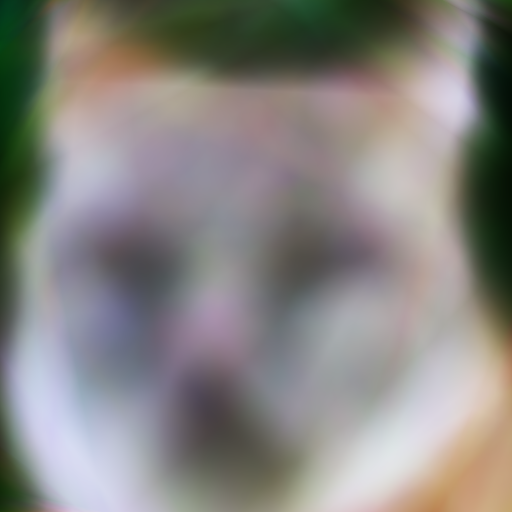

Epoch 200, loss = 0.087


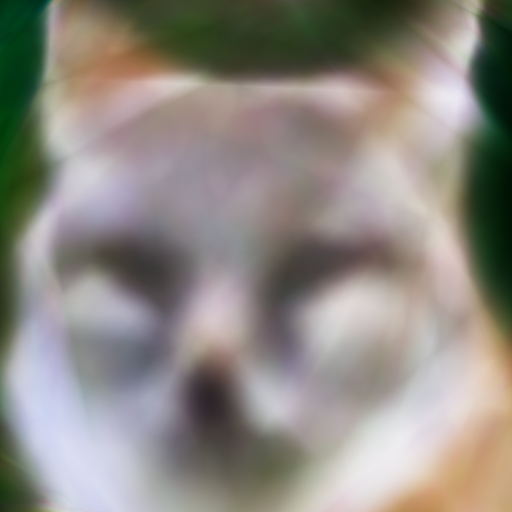

Epoch 300, loss = 0.078


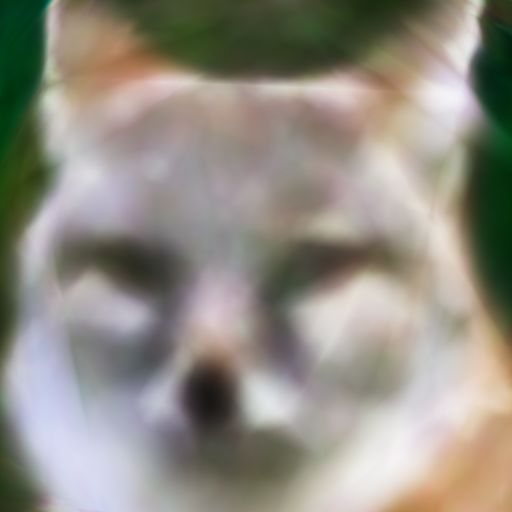

In [8]:
run_test('simple',hidden_dim=256,iter_per_epoch=100,num_epochs=4)

cuda
Target:


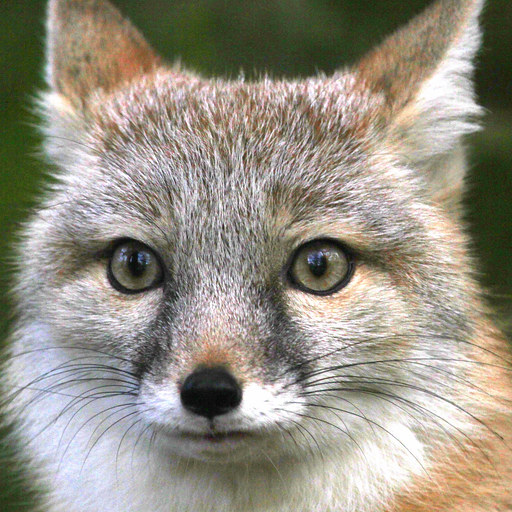

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch 0, loss = 0.233


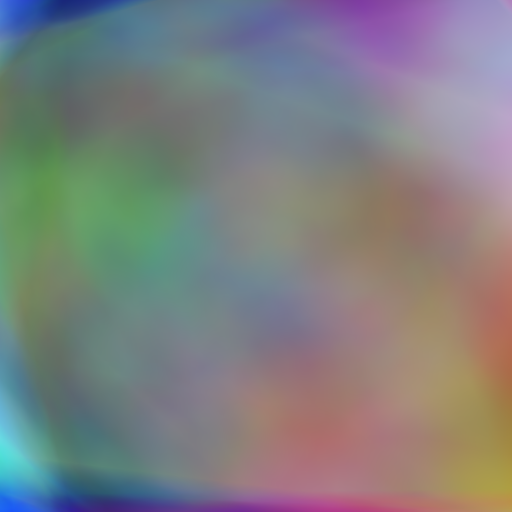

Epoch 100, loss = 0.108


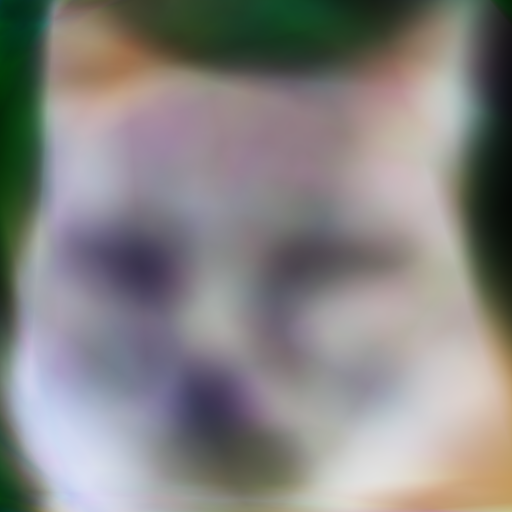

Epoch 200, loss = 0.085


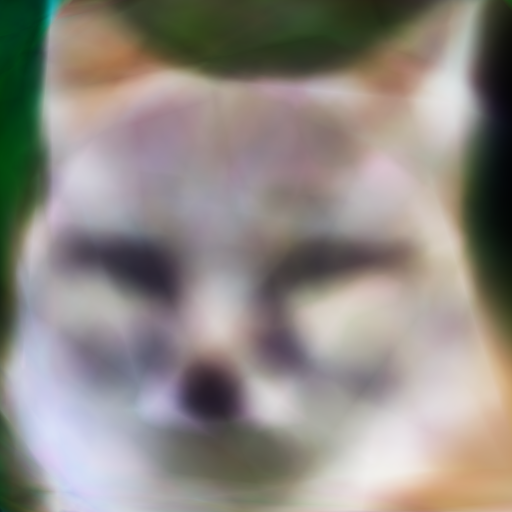

Epoch 300, loss = 0.077


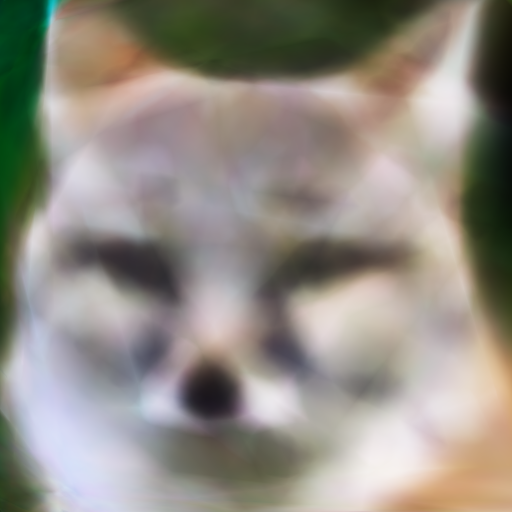

In [9]:
run_test('simple',mapping_size=128,hidden_dim=256,scale=1,iter_per_epoch=100,num_epochs=4)

cuda
Target:


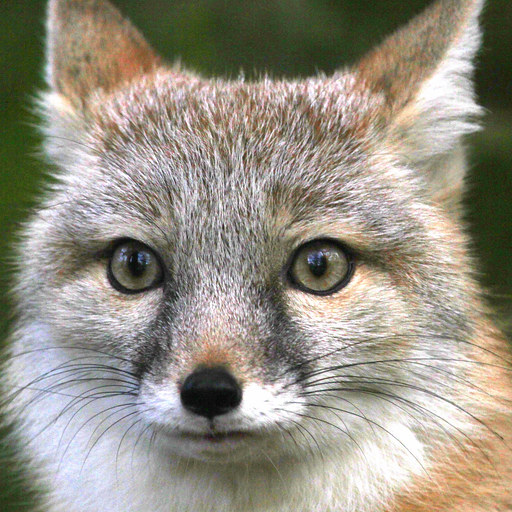

  0%|          | 0/700 [00:00<?, ?it/s]

Epoch 0, loss = 0.229


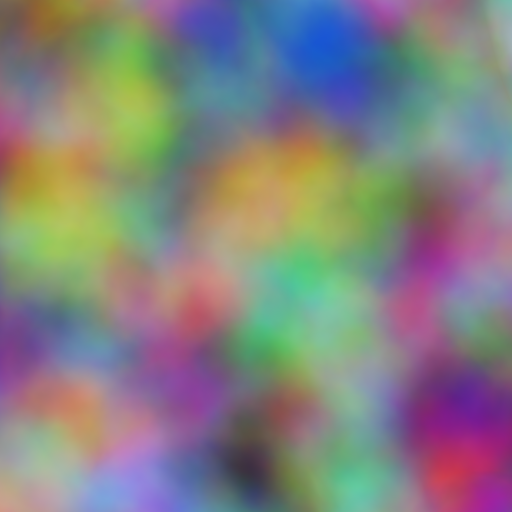

Epoch 100, loss = 0.079


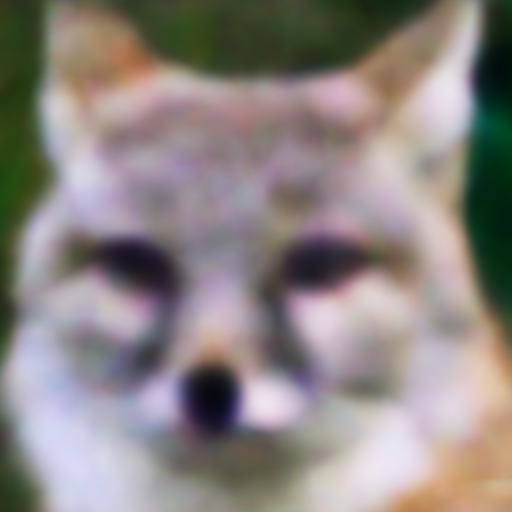

Epoch 200, loss = 0.066


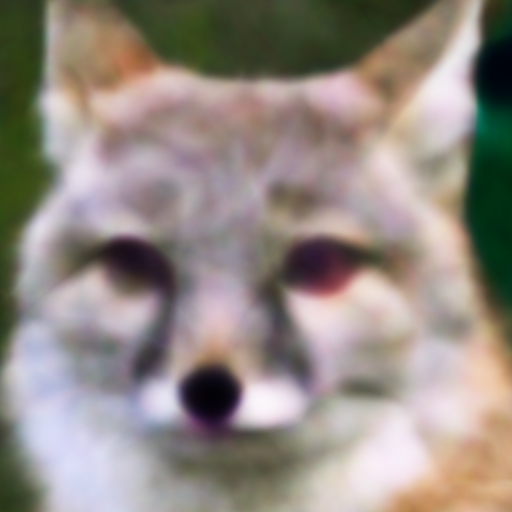

Epoch 300, loss = 0.062


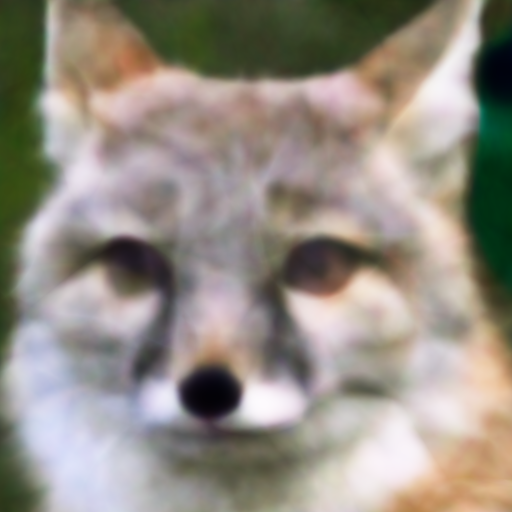

Epoch 400, loss = 0.060


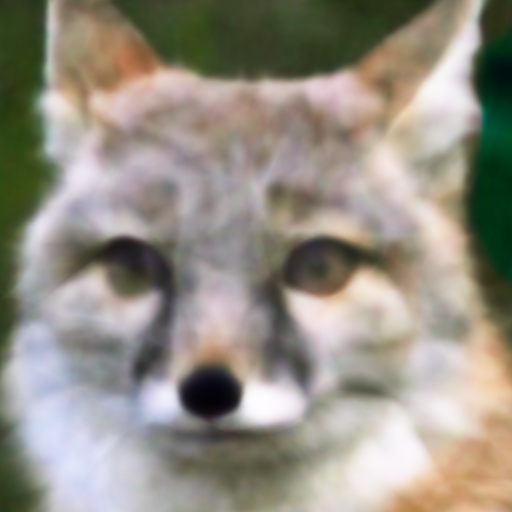

Epoch 500, loss = 0.059


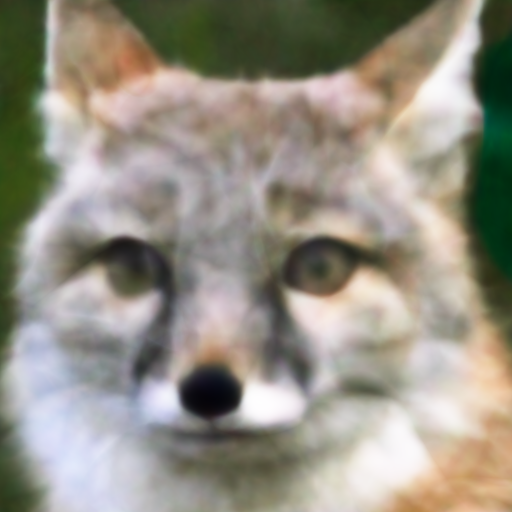

Epoch 600, loss = 0.058


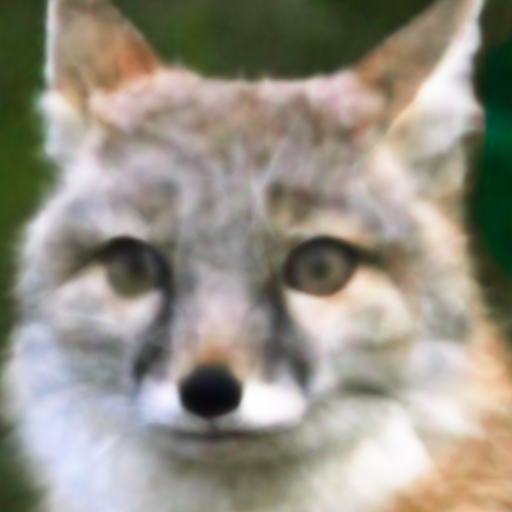

In [10]:
run_test('fourier',mapping_size=128,hidden_dim=256,scale=1,iter_per_epoch=100,num_epochs=7)

cuda
Target:


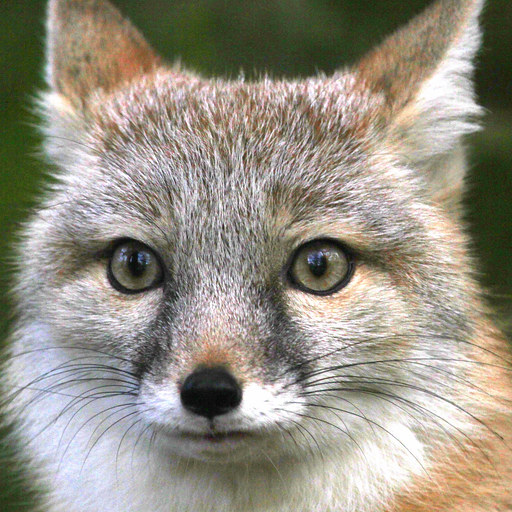

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch 0, loss = 0.233


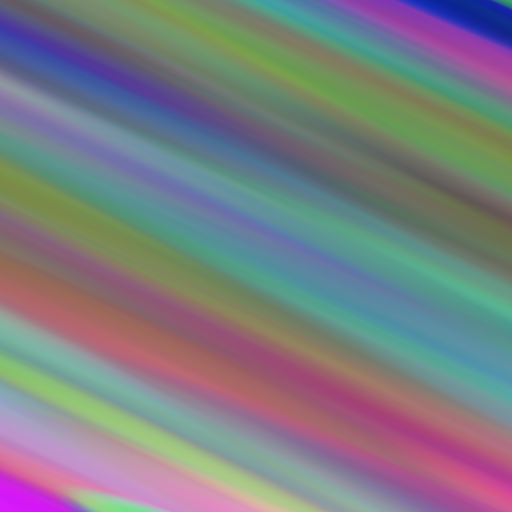

Epoch 100, loss = 0.168


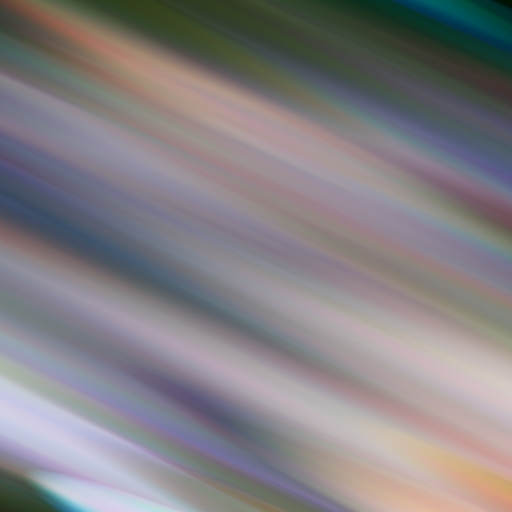

Epoch 200, loss = 0.144


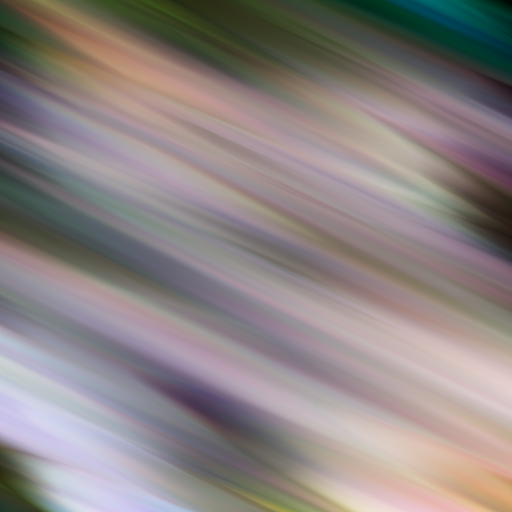

Epoch 300, loss = 0.127


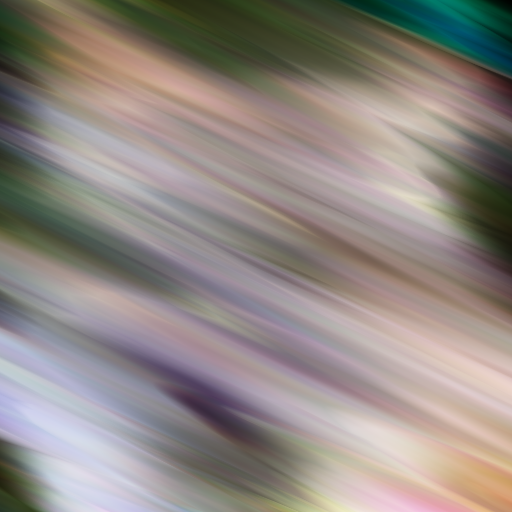

In [11]:
run_test('fourier',mapping_size=2,hidden_dim=128,scale=1,iter_per_epoch=100,num_epochs=4)

cuda
Target:


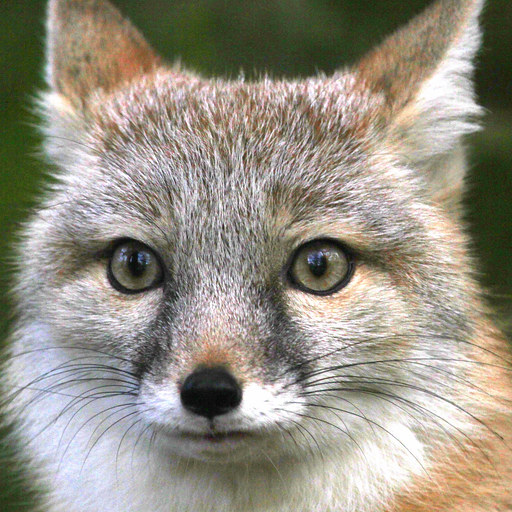

  0%|          | 0/10000 [00:00<?, ?it/s]

Epoch 0, loss = 0.239


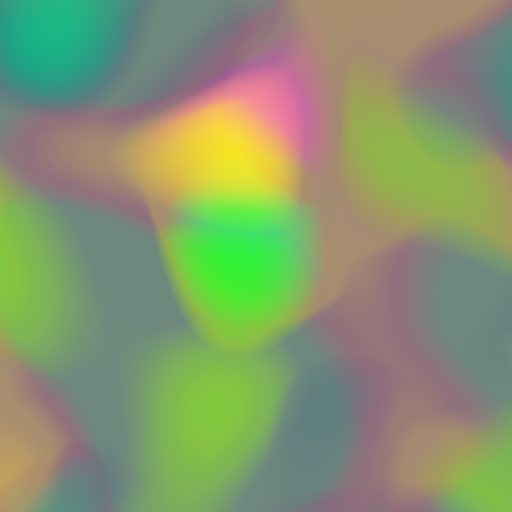

Epoch 2000, loss = 0.113


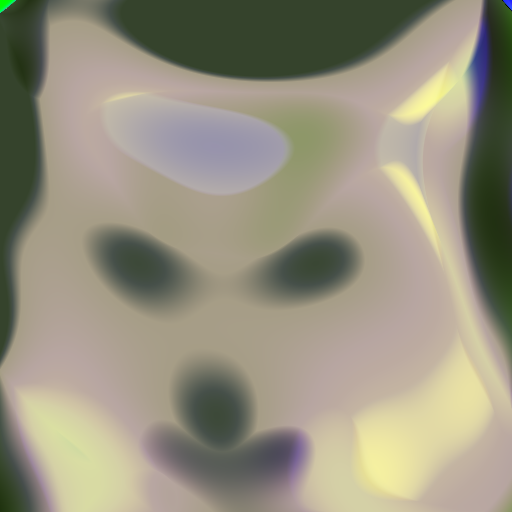

Epoch 4000, loss = 0.104


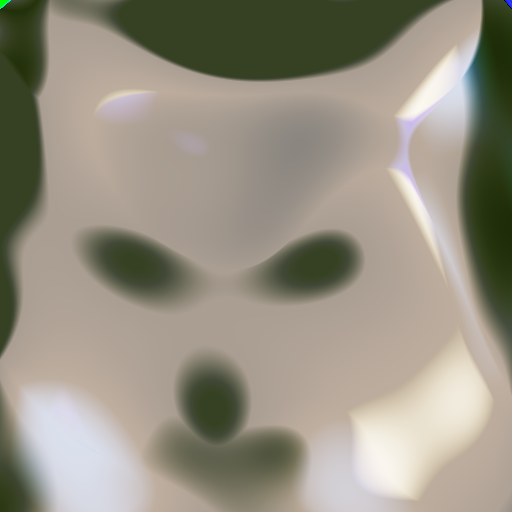

Epoch 6000, loss = 0.103


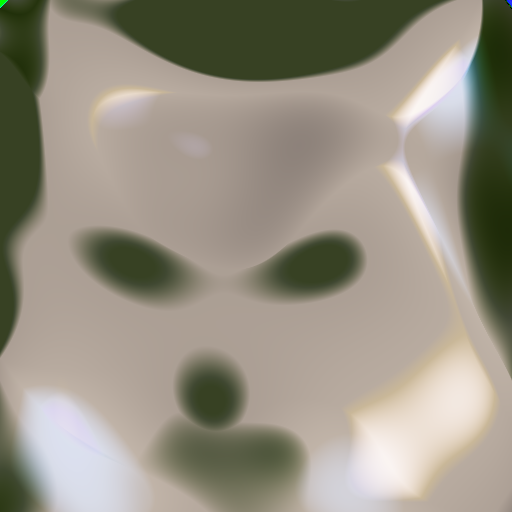

Epoch 8000, loss = 0.102


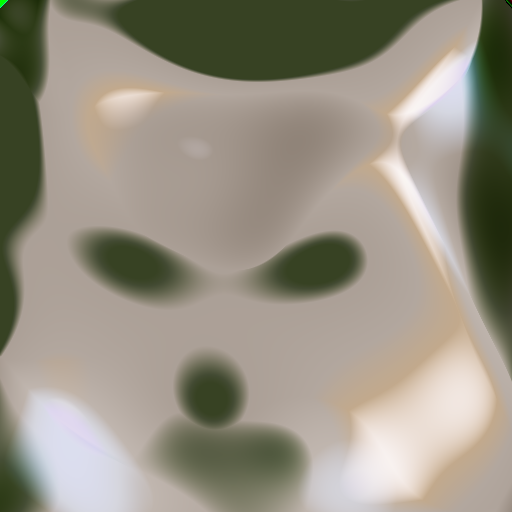

In [12]:
run_test('fourier',mapping_size=256,hidden_dim=5,scale=1,iter_per_epoch=2000,num_epochs=5)

cuda
Target:


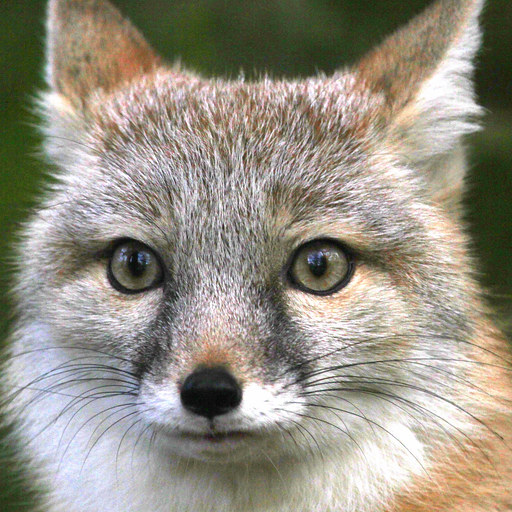

  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 0, loss = 0.255


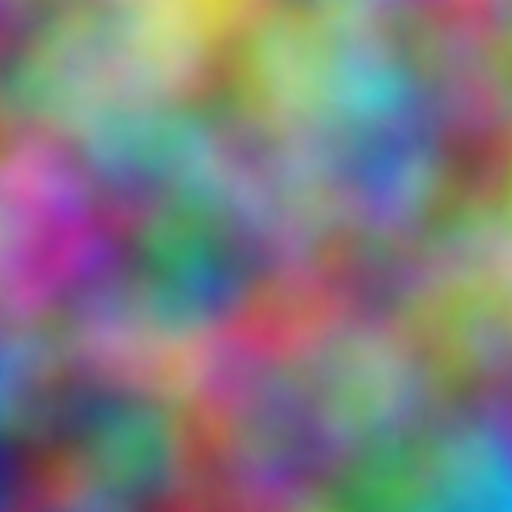

Epoch 100, loss = 0.078


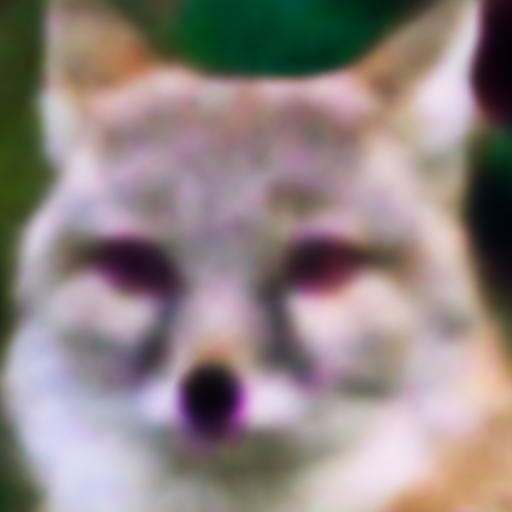

Epoch 200, loss = 0.068


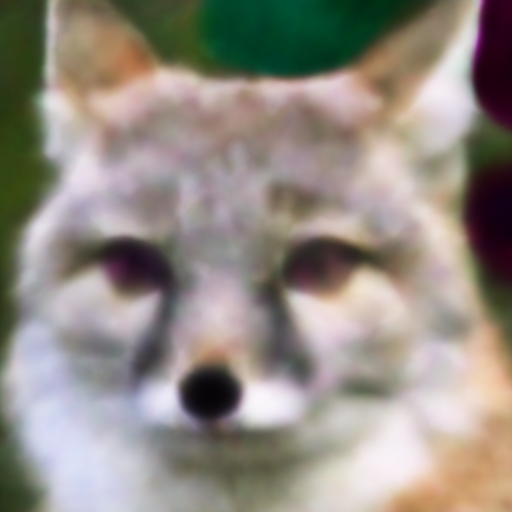

Epoch 300, loss = 0.064


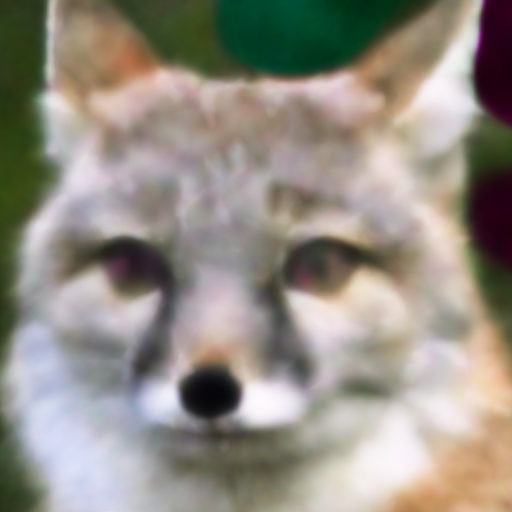

Epoch 400, loss = 0.062


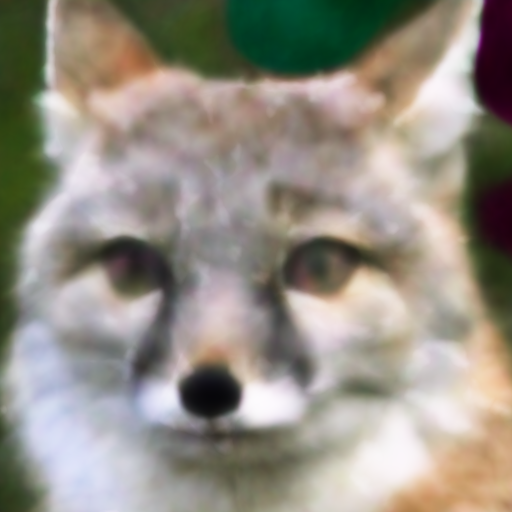

In [13]:
run_test('fourier',mapping_size=256,hidden_dim=256,scale=1,iter_per_epoch=100,num_epochs=5)